<a href="https://colab.research.google.com/github/StrawEater/PracticasPDI3erBimestre/blob/main/Laboratorios/Laboratorio3_Pdi2026.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Laboratorio 3: Color**

Hasta ahora solo hemos trabajado con imágenes en blanco y negro, por lo que solo podiamos utilizar los valores de iluminacion para aplicar transformaciones o realizar un analisis de su contenido. Aunque esta información ya es rica de por si, podemos ganar contexto si tomamos en cuenta la información cromatica ignorada hasta ahora.




In [26]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d.art3d import Line3DCollection
from ipywidgets import interact, IntSlider, FloatSlider
from skimage.color import rgb2gray
import json
from functools import lru_cache
import plotly.graph_objects as go
import plotly.io as pio
from skimage.draw import ellipsoid
from skimage.measure import marching_cubes
import ipywidgets as widgets
from IPython.display import display

SIZE = 255  # RGB channel max

## **Pérdida de Información al Pasaje a Gris**

Al pasar de 3 canales de información a 1, es necesario que perdamos información. Es por esto que al pasar una imagen a color a escala de grises, podríamos ignorar diferencias importantes entre secciones de la imagen.

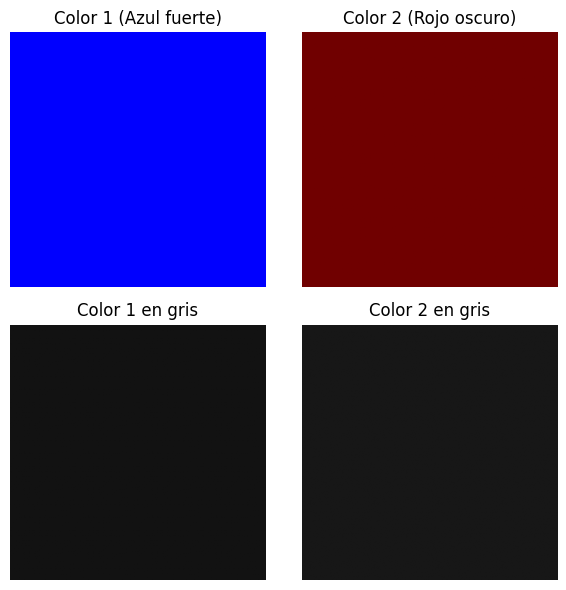

In [27]:
# Creo dos bloques de color
color1 = np.ones((100, 100, 3), dtype=np.float32)
color2 = np.ones((100, 100, 3), dtype=np.float32)

# Asignar colores normalizados (0 a 1)
color1[:] = [0, 0, 1]         # Azul fuerte
color2[:] = [112/255, 0, 0]   # Rojo oscuro

# Convertir a escala de grises
gray1 = rgb2gray(color1)
gray2 = rgb2gray(color2)

# Mostrar resultados
fig, axs = plt.subplots(2, 2, figsize=(6, 6))

axs[0, 0].imshow(color1, clim=(0,1))
axs[0, 0].set_title("Color 1 (Azul fuerte)")
axs[0, 0].axis('off')

axs[0, 1].imshow(color2, clim=(0,1))
axs[0, 1].set_title("Color 2 (Rojo oscuro)")
axs[0, 1].axis('off')

axs[1, 0].imshow(gray1, cmap='gray', clim=(0,1))
axs[1, 0].set_title("Color 1 en gris")
axs[1, 0].axis('off')

axs[1, 1].imshow(gray2, cmap='gray', clim=(0,1))
axs[1, 1].set_title("Color 2 en gris")
axs[1, 1].axis('off')

plt.tight_layout()
plt.show()

## **Espacio de Color RGB**

Usualmente las imágenes digitales están en el espacio de color **RGB**, simulando la forma en la que el ojo humano reacciona e interpreta distintas frecuencias del espectro electromagnético visible. Utilizando distintas intensidades de luz **Roja**, **Verde** y **Azul**, se puede engañar al cerebro para ver un color que no existe realmente. Aunque este formato es conveniente para visualizar en pantallas modernas, falla en tareas mas complejas del procesamiento de imagenes, por ejemplo: *"Mejorar la iluminacion de una imagen sin cambiar el color de los objetos en ella*"

In [28]:
def pltImagenConH(imagen, imagenH, nombre, color, axs, columna):

  dicNombreColorMatplotlib = {
    "Rojo": "red",
    "Verde": "green",
    "Azul": "blue",
    "Gris": "black"
  }

  dicNombreColorMap = {
    "Rojo": "Reds_r",
    "Verde": "Greens_r",
    "Azul": "Blues_r",
    "Gris": None
  }

  axs[0][columna].set_title(f"Imagen {nombre}")
  axs[0][columna].axis("off")
  axs[0][columna].imshow(imagen, cmap=dicNombreColorMap[color], clim=(0,1))

  axs[1][columna].set_title(f"Histograma {color}")
  axs[1][columna].grid(True)
  axs[1][columna].hist(imagenH.ravel(), bins=256, color=dicNombreColorMatplotlib[color])



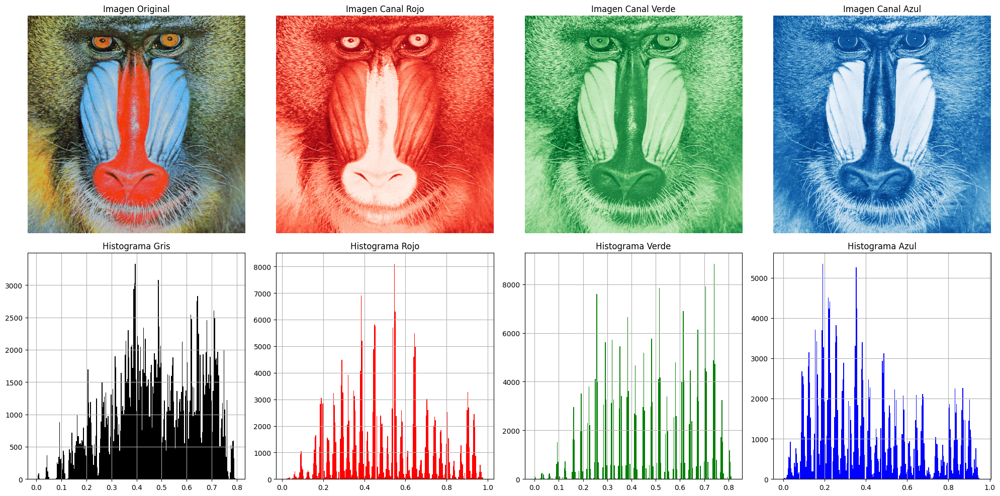

In [5]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import io, data, util, color
import urllib.request

url = "https://github.com/androbaza/standard-test-images/raw/refs/heads/main/mandril_color.tif"
urllib.request.urlretrieve(url, "mandril_color.tif")

# Cargamos una imagen a Color
imagenRGB = util.img_as_float64(io.imread("mandril_color.tif"))

# Canal Rojo
imagenRojo = imagenRGB[:,:,0]

# Canal Verde
imagenVerde = imagenRGB[:,:,1]

# Canal Azul
imagenAzul = imagenRGB[:,:,2]

fig, axs = plt.subplots(2,4, figsize=(20,10))

pltImagenConH(imagenRGB, color.rgb2gray(imagenRGB), "Original", "Gris", axs, 0)
pltImagenConH(imagenRojo, imagenRojo, "Canal Rojo", "Rojo", axs, 1)
pltImagenConH(imagenVerde, imagenVerde, "Canal Verde", "Verde", axs, 2)
pltImagenConH(imagenAzul, imagenAzul, "Canal Azul", "Azul", axs, 3)

plt.tight_layout()
plt.show()

In [6]:
# @title #Visaulizacion del espacio RGB en 3D

pio.renderers.default = "colab"

SIZE = 255        # RGB channel max
RES = 14           # tessellation resolution per cube face
MARKER_RADIUS = 9  # radius (in RGB units) of the sphere marking the current color

def build_face(res, point_fn, color_fn):
    """
    Tesselate one face into a triangulated vertex grid.
    point_fn/color_fn map normalized (a, b) in [0,1]^2 -> 3D point / RGB in [0,1].
    Returns (xs, ys, zs, colors) — vertex positions and per-vertex color strings.
    """
    u = np.linspace(0, 1, res)
    v = np.linspace(0, 1, res)
    xs, ys, zs, colors = [], [], [], []
    for a in u:
        for b in v:
            x, y, z = point_fn(a, b)
            r, g, bl = color_fn(a, b)
            xs.append(x); ys.append(y); zs.append(z)
            colors.append(f"rgb({int(np.clip(r,0,1)*255)},{int(np.clip(g,0,1)*255)},{int(np.clip(bl,0,1)*255)})")
    return xs, ys, zs, colors


def face_triangles(res):
    """
    Triangle indices (LOCAL, 0-based) for a res x res vertex grid built by
    build_face(). Every one of the 6 faces uses this exact same pattern,
    since build_face always walks the grid in the same a-outer/b-inner order
    regardless of which 3D shape it's mapped onto.
    """
    def idx(i, j):
        return i * res + j
    tri = []
    for i in range(res - 1):
        for j in range(res - 1):
            a_, b_, c_, d_ = idx(i, j), idx(i + 1, j), idx(i + 1, j + 1), idx(i, j + 1)
            tri.append((a_, b_, c_))
            tri.append((a_, c_, d_))
    return tri


_FACE_TRI = face_triangles(RES)
_N_FACE_VERTS = RES * RES

# ---------------------------------------------------------------------------
# Parts of the scene that never change between slider moves are built ONCE,
# up front, instead of being recomputed on every single update.
# ---------------------------------------------------------------------------

# The bottom face (blue = 0 plane) doesn't depend on the current blue value
# at all — it's identical in every frame.
_BOTTOM = build_face(RES, lambda a, b: (a * SIZE, b * SIZE, 0), lambda a, b: (a, b, 0))

def uv_sphere(radius, n_lat=10, n_lon=16):
    """
    A plain latitude/longitude sphere mesh, centered at the origin. Two pole
    vertices plus n_lat interior rings of n_lon vertices each; poles are
    triangle fans into the nearest ring, interior rings are quad strips
    split into triangles.
    """
    verts = [(0.0, 0.0, radius)]  # north pole, index 0
    for i in range(n_lat):
        theta = np.pi * (i + 1) / (n_lat + 1)  # strictly between the poles
        for j in range(n_lon):
            phi = 2 * np.pi * j / n_lon
            verts.append((radius * np.sin(theta) * np.cos(phi),
                          radius * np.sin(theta) * np.sin(phi),
                          radius * np.cos(theta)))
    verts.append((0.0, 0.0, -radius))  # south pole, last index
    verts = np.array(verts)
    south_idx = len(verts) - 1

    faces = []
    for j in range(n_lon):  # north pole fan
        faces.append((0, 1 + j, 1 + (j + 1) % n_lon))
    for i in range(n_lat - 1):  # interior ring strips
        r0 = 1 + i * n_lon
        r1 = 1 + (i + 1) * n_lon
        for j in range(n_lon):
            a, b, c, d = r0 + j, r0 + (j + 1) % n_lon, r1 + (j + 1) % n_lon, r1 + j
            faces.append((a, b, c)); faces.append((a, c, d))
    last_ring = 1 + (n_lat - 1) * n_lon
    for j in range(n_lon):  # south pole fan
        faces.append((south_idx, last_ring + (j + 1) % n_lon, last_ring + j))
    return verts, faces


# The marker sphere's shape never changes, only its center, so it's built
# ONCE here; every update below just translates these cached vertices with
# a cheap numpy add.
_marker_verts0, _MARKER_FACES = uv_sphere(MARKER_RADIUS)
_N_MARKER_VERTS = len(_marker_verts0)
_MARKER_COLOR = ["rgb(255,255,255)"] * _N_MARKER_VERTS

def _face_defs(blue):
    """The 5 faces whose geometry (and color) depend on the current blue value."""
    return [
        (lambda a, b: (a * SIZE, b * SIZE, blue), lambda a, b: (a, b, blue / SIZE)),      # top
        (lambda a, b: (a * SIZE, 0, b * blue),    lambda a, b: (a, 0, b * blue / SIZE)),  # front (green=0)
        (lambda a, b: (a * SIZE, SIZE, b * blue), lambda a, b: (a, 1, b * blue / SIZE)),  # back
        (lambda a, b: (0, a * SIZE, b * blue),    lambda a, b: (0, a, b * blue / SIZE)),  # left (red=0)
        (lambda a, b: (SIZE, a * SIZE, b * blue), lambda a, b: (1, a, b * blue / SIZE)),  # right
    ]

@lru_cache(maxsize=256)
def _slab_for_blue(blue):
    """
    The 5 blue-dependent faces, cached per integer blue value (0-255).
    Moving only the red or green slider hits this cache every time (blue is
    unchanged), so none of this face geometry is rebuilt in that case — only
    the marker sphere needs a new position.
    """
    xs_all, ys_all, zs_all, colors_all = [], [], [], []
    for pf, cf in _face_defs(blue):
        xs, ys, zs, colors = build_face(RES, pf, cf)
        xs_all += xs; ys_all += ys; zs_all += zs; colors_all += colors
    return xs_all, ys_all, zs_all, colors_all

def _combined_triangles():
    i_all, j_all, k_all = [], [], []
    offset = 0
    for _ in range(6):  # bottom + top + front + back + left + right
        for (a_, b_, c_) in _FACE_TRI:
            i_all.append(a_ + offset); j_all.append(b_ + offset); k_all.append(c_ + offset)
        offset += _N_FACE_VERTS
    for (a_, b_, c_) in _MARKER_FACES:
        i_all.append(int(a_) + offset); j_all.append(int(b_) + offset); k_all.append(int(c_) + offset)
    return i_all, j_all, k_all


_I, _J, _K = _combined_triangles()

def _mesh_arrays(red, green, blue):
    """x, y, z, vertexcolor for the whole scene at the given color point."""
    sx, sy, sz, scolors = _slab_for_blue(blue)
    # Marker sits exactly at (red, green, blue) now — no more +14 offset.
    mx = (_marker_verts0[:, 0] + red).tolist()
    my = (_marker_verts0[:, 1] + green).tolist()
    mz = (_marker_verts0[:, 2] + blue).tolist()
    xs = _BOTTOM[0] + sx + mx
    ys = _BOTTOM[1] + sy + my
    zs = _BOTTOM[2] + sz + mz
    colors = _BOTTOM[3] + scolors + _MARKER_COLOR
    return xs, ys, zs, colors

def wireframe_trace():
    """Full-extent cube outline for context (constant, built once)."""
    lo, hi = 0, SIZE
    corners = {(ix, iy, iz): (x, y, z)
               for ix, x in enumerate((lo, hi))
               for iy, y in enumerate((lo, hi))
               for iz, z in enumerate((lo, hi))}
    xs, ys, zs = [], [], []
    for a, pa in corners.items():
        for b, pb in corners.items():
            if a < b and sum(abs(p - q) for p, q in zip(a, b)) == 1:
                xs += [pa[0], pb[0], None]
                ys += [pa[1], pb[1], None]
                zs += [pa[2], pb[2], None]
    return go.Scatter3d(x=xs, y=ys, z=zs, mode="lines",
                         line=dict(color="gray", width=2), showlegend=False, hoverinfo="skip")

def make_figure(red, green, blue):
    xs, ys, zs, colors = _mesh_arrays(red, green, blue)
    mesh = go.Mesh3d(x=xs, y=ys, z=zs, i=_I, j=_J, k=_K, vertexcolor=colors,
                      flatshading=False, opacity=1.0, showscale=False,
                      lighting=dict(ambient=1, diffuse=0, specular=0))
    fig = go.Figure(data=[mesh, wireframe_trace()])
    fig.update_layout(
        scene=dict(
            xaxis=dict(title="Red", range=[0, SIZE]),
            yaxis=dict(title="Green", range=[0, SIZE]),
            zaxis=dict(title="Blue", range=[0, SIZE]),
            aspectmode="cube",
        ),
        title=f"RGB = ({red}, {green}, {blue})   #{red:02X}{green:02X}{blue:02X}",
        margin=dict(l=0, r=0, b=0, t=30),
        showlegend=False,
        width=600, height=600,
    )
    return fig

from google.colab import output as colab_output
from IPython.display import display, HTML, Javascript


def _slider_html(red, green, blue):
    hex_code = f"#{red:02X}{green:02X}{blue:02X}"
    # The swatch is pure client-side: updateSwatch() reads the three sliders
    # directly and repaints on every oninput event, so it tracks the drag in
    # real time instead of waiting for the (throttled-to-release) Python
    # round trip that drives the 3D plot.
    return f"""
<script>
function updateSwatch() {{
  var r = r_in.valueAsNumber, g = g_in.valueAsNumber, b = b_in.valueAsNumber;
  var hex = '#' + [r, g, b].map(function(v) {{
    return v.toString(16).padStart(2, '0').toUpperCase();
  }}).join('');
  swatch.style.backgroundColor = 'rgb(' + r + ',' + g + ',' + b + ')';
  swatch_label.innerHTML = hex + '<br>rgb(' + r + ', ' + g + ', ' + b + ')';
}}
</script>
<div style="display:flex; gap:24px; align-items:flex-start; font-family: sans-serif;">
  <div style="max-width: 320px; flex: 1;">
    <div>Red <output id="r_out">{red}</output></div>
    <input id="r_in" type="range" min="0" max="255" step="1" value="{red}" style="width:100%"
           oninput="r_out.value=this.value; updateSwatch()"
           onchange="google.colab.kernel.invokeFunction(
              'notebook.updateCube',
              [this.valueAsNumber, g_in.valueAsNumber, b_in.valueAsNumber], {{}})">

    <div>Green <output id="g_out">{green}</output></div>
    <input id="g_in" type="range" min="0" max="255" step="1" value="{green}" style="width:100%"
           oninput="g_out.value=this.value; updateSwatch()"
           onchange="google.colab.kernel.invokeFunction(
              'notebook.updateCube',
              [r_in.valueAsNumber, this.valueAsNumber, b_in.valueAsNumber], {{}})">

    <div>Blue <output id="b_out">{blue}</output></div>
    <input id="b_in" type="range" min="0" max="255" step="1" value="{blue}" style="width:100%"
           oninput="b_out.value=this.value; updateSwatch()"
           onchange="google.colab.kernel.invokeFunction(
              'notebook.updateCube',
              [r_in.valueAsNumber, g_in.valueAsNumber, this.valueAsNumber], {{}})">
  </div>

  <div style="display:flex; flex-direction:column; align-items:center; gap:8px;">
    <div id="swatch" style="width:100px; height:100px; border:1px solid #888;
                border-radius:8px; background-color: rgb({red},{green},{blue});"></div>
    <div id="swatch_label" style="font-family: monospace; font-size:13px; text-align:center;">
      {hex_code}<br>rgb({red}, {green}, {blue})
    </div>
  </div>
</div>
"""


def _initial_html(red, green, blue):
    # div_id="cube-plot" is what lets later updates find and patch this exact
    # plot instance via document.getElementById('cube-plot').
    plot_html = make_figure(red, green, blue).to_html(
        full_html=False, include_plotlyjs="cdn", div_id="cube-plot"
    )
    return _slider_html(red, green, blue) + plot_html


def _update_cube(red, green, blue):
    red, green, blue = int(red), int(green), int(blue)
    xs, ys, zs, colors = _mesh_arrays(red, green, blue)
    title = f"RGB = ({red}, {green}, {blue})   #{red:02X}{green:02X}{blue:02X}"
    js = f"""
(function() {{
  var gd = document.getElementById('cube-plot');
  if (!gd) return;
  Plotly.restyle(gd, {{
    x: [{json.dumps(xs)}],
    y: [{json.dumps(ys)}],
    z: [{json.dumps(zs)}],
    vertexcolor: [{json.dumps(colors)}]
  }}, [0]);
  Plotly.relayout(gd, {{title: {json.dumps(title)}}});
}})();
"""
    display(Javascript(js))


colab_output.register_callback('notebook.updateCube', _update_cube)

display(HTML(_initial_html(128, 128, 200)))

## **Cromacidad e Iluminacion**

Para empezar, nos gustaria poder hablar de informacion cromatica (color) e Iluminacion de manera separada para podernos hacer preguntas como:
- Puedo aumentar la iluminacion de esta imagen sin cambiar sus colores?
- Puedo cambiar el tono de una imagen sin tocar su iluminacion?


Una manera directa de hacerlo, puede ser tomando el promedio de los colores como componente de iluminacion y la normalizacion de los canales como componente cromatico.

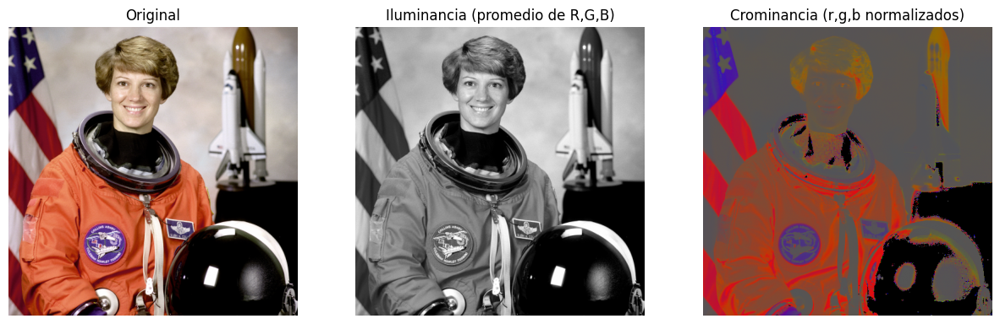

In [7]:
from skimage import data, img_as_float

IMAGE = img_as_float(data.astronaut())

def illuminance_and_chroma(img):
  """Separa imagen RGB en:
  - Iluminancia: Promedio R, G, B por pixel
  - chroma: Normalizacion de (r, g, b) con r+g+b == 1
  """
  illuminance = img.mean(axis=-1)

  total = img.sum(axis=-1, keepdims=True)
  total_safe = np.where(total == 0, 1, total)  # No dividimos por 0
  chroma = img / total_safe

  return illuminance, chroma

illuminance, chroma = illuminance_and_chroma(IMAGE)

fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].imshow(IMAGE)
axes[0].set_title("Original")
axes[1].imshow(illuminance, cmap="gray", vmin=0, vmax=1)
axes[1].set_title("Iluminancia (promedio de R,G,B)")
axes[2].imshow(chroma)
axes[2].set_title("Crominancia (r,g,b normalizados)")
for ax in axes:
    ax.axis("off")
plt.show()

Con esto ya podemos tratar cada componente por separado

In [8]:
def reconstruct_from_illuminance_chroma(illuminance, chroma):
    """Invierte illuminance_and_chroma: img = chroma * total, donde total = 3 * illuminance."""
    total = 3 * illuminance
    return chroma * total[..., np.newaxis]

def show_reconstruction(brightness=1.0):
    """Reconstruye a partir de iluminancia y crominancia, aplicando el mismo ajuste
    de brillo que antes: suma 0.1 * brightness a la iluminancia y recorta a [0, 1]."""

    offset = 0.1 * brightness
    illuminance_modificada = np.clip(illuminance + offset, 0, 1)
    reconstructed = reconstruct_from_illuminance_chroma(illuminance_modificada, chroma)

    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    axes[0].imshow(illuminance_modificada, cmap="gray", vmin=0, vmax=1)
    axes[0].set_title("Iluminancia (promedio de R,G,B)")
    axes[1].imshow(chroma)
    axes[1].set_title("Crominancia (r,g,b normalizados)")
    axes[2].imshow(np.clip(reconstructed, 0, 1))  # recorte por seguridad: chroma * total puede superar 1
    axes[2].set_title(f"Reconstruida (brillo +{offset:.2f})")

    for ax in axes:
        ax.axis("off")
    plt.show()

interact(show_reconstruction, brightness=FloatSlider(min=-5.0, max=5.1, step=0.1, value=1.0, description="Brightness"));

interactive(children=(FloatSlider(value=1.0, description='Brightness', max=5.1, min=-5.0), Output()), _dom_cla…

### **Existe una mejor manera de representar el componente cromatico?**

Si suponemos que la suma de los colores debe ser igual a 1, entonces una de las tres dimensiones de color esta definida por las otras dos. Podemos separa el canal cromatico en 2 componentes.

In [9]:
def rb_triangle_image(resolution=400):
  """Crea la imagen del triangulo R/B: arriba = mas rojo, derecha = mas azul.
  El color en cada pixel es (r, 1 - r - b, b). transparente donde r + g > 1."""
  r = np.linspace(0, 1, resolution)  # eje vertical -> rojo
  b = np.linspace(0, 1, resolution)  # eje horizontal -> azul
  bb, rr = np.meshgrid(b, r)         # cuadrado (resolution, resolution)

  g = 1.0 - rr - bb # Conceguimos el valor de verde en cada pixel
  inside = g >= 0 # Si es negativo, no esta adentro del triangulo

  rgb = np.stack([rr, np.clip(g, 0, 1), bb], axis=-1) # Creamos la imagen
  alpha = inside.astype(float)
  return np.dstack([rgb, alpha]) # Agregamos transparencia

TRIANGLE_IMG = rb_triangle_image()

def show_triangle(brightness=1.0):
  """Scale RGB by `brightness` (alpha/shape untouched)."""
  img = TRIANGLE_IMG.copy()
  #multiplicamos por una constante que es el brillo
  img[..., :3] = np.clip(img[..., :3] + 0.1 * brightness, 0, 1)
  plt.figure(figsize=(4, 4))
  plt.imshow(img, origin="lower", extent=[0, 1, 0, 1])
  plt.xlabel("Azul")
  plt.ylabel("Rojo")
  plt.title(f"R/B triangle (brightness {0.1 * brightness:.2f})")
  plt.show()

interact(show_triangle, brightness=FloatSlider(min=-5.0, max=5.01, step=0.1, value=0.0, description="Brightness"));

interactive(children=(FloatSlider(value=0.0, description='Brightness', max=5.01, min=-5.0), Output()), _dom_cl…

In [10]:
def show_illuminance_chroma_rb(brightness=1.0, red=0.0, blue=0.0):
    """Modifica la iluminancia y los canales rojo y azul de la crominancia,
    cada uno con su propio slider, y muestra la reconstrucción resultante.
    El canal verde de la crominancia ya no se guarda: se calcula como 1 - r - b."""

    offset_i = 0.1 * brightness
    offset_r = 0.1 * red
    offset_b = 0.1 * blue

    illuminance_mod = np.clip(illuminance + offset_i, 0, 1)
    illuminance_mod[illuminance == 0] = 0

    chroma_mod = chroma.copy()
    chroma_mod[..., 0] = np.clip(chroma[..., 0] + offset_r, 0, 1)  # rojo
    chroma_mod[..., 2] = np.clip(chroma[..., 2] + offset_b, 0, 1)  # azul
    chroma_mod[..., 1] = np.clip(1 - chroma_mod[..., 0] - chroma_mod[..., 2], 0, 1)  # verde = 1 - r - b

    reconstructed = reconstruct_from_illuminance_chroma(illuminance_mod, chroma_mod)

    fig, axes = plt.subplots(1, 4, figsize=(20, 5))
    axes[0].imshow(illuminance_mod, cmap="gray", vmin=0, vmax=1)
    axes[0].set_title(f"Iluminancia (+{offset_i:.2f})")
    axes[1].imshow(chroma_mod[..., 0], cmap="Reds", vmin=0, vmax=1)
    axes[1].set_title(f"Chroma rojo (+{offset_r:.2f})")
    axes[2].imshow(chroma_mod[..., 2], cmap="Blues", vmin=0, vmax=1)
    axes[2].set_title(f"Chroma azul (+{offset_b:.2f})")
    axes[3].imshow(np.clip(reconstructed, 0, 1))
    axes[3].set_title("Reconstruida")

    for ax in axes:
        ax.axis("off")
    plt.show()

interact(show_illuminance_chroma_rb,
         brightness=FloatSlider(min=0.1, max=3.0, step=0.1, value=1.0, description="Brillo"),
         red=FloatSlider(min=-3.0, max=3.0, step=0.1, value=0.0, description="Rojo"),
         blue=FloatSlider(min=-3.0, max=3.0, step=0.1, value=0.0, description="Azul"));

interactive(children=(FloatSlider(value=1.0, description='Brillo', max=3.0, min=0.1), FloatSlider(value=0.0, d…

## **Espacio de Color YCbCr**
El espacio de color YCbCr se creo con solucion de un problema especifico, lograr backward compatibility en la transicion de televisiones blanco y negro a color. El objetivo era poder trasmitir el componente de iluminacion separado del componente cromatico, de esta forma una television blanco y negro podria ignorar el componente cromatico y solo trasmitir el componente de iluminacion.


La conversion sigue la siguiente formula:

![](https://wikimedia.org/api/rest_v1/media/math/render/svg/82ceab4d9e18603ac6e4dab60d098d0df2808505)

$P_B$ nos habla de que tanto mas azul hay que la iluminacion nos haria creer.

$P_R$ nos habla de que tanto mas rojo hay que la iluminacion nos haria creer.

Utilizamos un promedio pesado, ya que no cada canal contribuye de la misma forma a la percepcion de iluminocidad del ojo humano.

![](https://wikimedia.org/api/rest_v1/media/math/render/svg/be1559cbc23ccb3337ac81a2d7f7148f2fe0bca3)

![](https://wikimedia.org/api/rest_v1/media/math/render/svg/c729507bcd633db1cb8820f4d03e3c95b5653d59)

In [11]:
from skimage import color

def rgb_to_ycbcr(img):
  """Convierte RGB a YCbCr usando la función de scikit-image.
  Nota: usa la escala 0-255 con headroom/footroom (Y en [16,235], Cb/Cr en [16,240])."""
  ycbcr = color.rgb2ycbcr(img)
  return ycbcr[..., 0], ycbcr[..., 1], ycbcr[..., 2]

def ycbcr_to_rgb(Y, Cb, Cr):
  """Reconstruye RGB a partir de Y, Cb, Cr usando la función de scikit-image."""
  ycbcr = np.stack([Y, Cb, Cr], axis=-1)
  return color.ycbcr2rgb(ycbcr)

IMAGE = img_as_float(data.astronaut())
Y, Cb, Cr = rgb_to_ycbcr(IMAGE)

In [12]:
from matplotlib.colors import LinearSegmentedColormap, TwoSlopeNorm

# Cb: bajo = mas amarillo, alto = mas azul
cmap_cb = LinearSegmentedColormap.from_list("cb", ["#e8d000", "#808080", "#0040ff"])

# Cr: bajo = mas cian/verde, alto = mas rojo
cmap_cr = LinearSegmentedColormap.from_list("cr", ["#00c8c8", "#808080", "#ff2020"])

norm_cbcr = TwoSlopeNorm(vmin=0, vcenter=128, vmax=255)  # 128 = neutro (sin color)

def show_ycbcr(brightness=0.0, cb=0.0, cr=0.0):
    """Modifica Y (brillo), Cb y Cr, cada uno con su slider, usando las funciones
    de scikit-image para convertir y reconstruir."""

    offset_y = 25 * brightness
    offset_cb = 25 * cb
    offset_cr = 25 * cr

    Y_mod = np.clip(Y + offset_y, 0, 255)
    Cb_mod = np.clip(Cb + offset_cb, 0, 255)
    Cr_mod = np.clip(Cr + offset_cr, 0, 255)

    reconstructed = ycbcr_to_rgb(Y_mod, Cb_mod, Cr_mod)

    fig, axes = plt.subplots(1, 4, figsize=(20, 5))
    axes[0].imshow(Y_mod, cmap="gray", vmin=0, vmax=255)
    axes[0].set_title(f"Y (+{offset_y:.0f})")
    axes[1].imshow(Cb_mod, cmap=cmap_cb, norm=norm_cbcr)
    axes[1].set_title(f"Cb (+{offset_cb:.0f})")
    axes[2].imshow(Cr_mod, cmap=cmap_cr, norm=norm_cbcr)
    axes[2].set_title(f"Cr (+{offset_cr:.0f})")
    axes[3].imshow(np.clip(reconstructed, 0, 1))
    axes[3].set_title("Reconstruida")

    for ax in axes:
        ax.axis("off")
    plt.show()

interact(show_ycbcr,
         brightness=FloatSlider(min=0.1, max=3.0, step=0.1, value=1.0, description="Brillo (Y)"),
         cb=FloatSlider(min=-3.0, max=3.0, step=0.1, value=0.0, description="Cb"),
         cr=FloatSlider(min=-3.0, max=3.0, step=0.1, value=0.0, description="Cr"));

interactive(children=(FloatSlider(value=1.0, description='Brillo (Y)', max=3.0, min=0.1), FloatSlider(value=0.…

### **Robustez al ruido**

Otra ventaja de separar los componentes luminicos y cromaticos es la robustez al ruido durantes las transferencias de datos. El ojo humano da mas importancia a los cambios relativos de lumicidad que los cambios de color. Esto significa que el canal cromatico puede ser mas ruidoso, ya que su impacto es menos importante en la percepcion de la imagen.

El estandar para transmitir una transmision con formato YCbCr es darle mas ancho de banda al canal de iluminacion que al canal cromatico por esta misma razon.

In [13]:
import requests
from PIL import Image
from io import BytesIO
import numpy as np
import matplotlib.pyplot as plt

urls = {
    "Barco": "https://raw.githubusercontent.com/StrawEater/PracticasPDI3erBimestre/main/imagenes/barco.jpg",
    "Casita": "https://raw.githubusercontent.com/StrawEater/PracticasPDI3erBimestre/main/imagenes/casita.jpg",
    "Pecesito": "https://raw.githubusercontent.com/StrawEater/PracticasPDI3erBimestre/main/imagenes/pecesito.jpg",
    "Tortuga": "https://raw.githubusercontent.com/StrawEater/PracticasPDI3erBimestre/main/imagenes/tortuga.jpg"
}

imagenes = {}

for nombre, url in urls.items():
  response = requests.get(url)
  print(nombre, response.status_code)

  im = Image.open(BytesIO(response.content)).convert("RGB")
  imagenes[nombre] = np.array(im)



Barco 200
Casita 200
Pecesito 200
Tortuga 200


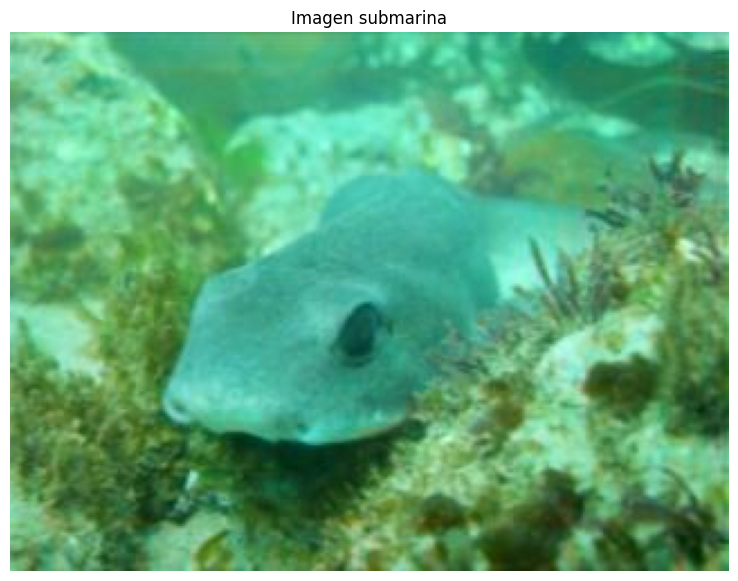

In [14]:


IMAGE_KEY = "Pecesito"

IMAGE=imagenes[IMAGE_KEY]

plt.figure(figsize=(10, 7))
plt.imshow(IMAGE)
plt.title("Imagen submarina")
plt.axis("off")
plt.show()

In [15]:
IMAGE=imagenes[IMAGE_KEY]
im_ycbcr = color.rgb2ycbcr(IMAGE)

Y  = im_ycbcr[:, :, 0]
Cb = im_ycbcr[:, :, 1]
Cr = im_ycbcr[:, :, 2]

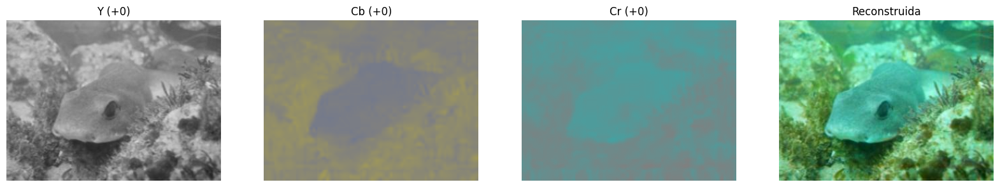

In [16]:
show_ycbcr()

In [17]:
def show_noise_comparison(sigma=40):
    """Compara el efecto de agregar ruido gaussiano en distintos espacios de color:
    RGB completo, solo el canal Y (luminancia) y solo Cb+Cr (color).
    Semilla fija para que, al mover el slider, el patrón de ruido no cambie
    de forma aleatoria en cada paso -- solo cambia su magnitud."""
    np.random.seed(42)

    # Ruido en RGB: la imagen está en [0,1], por eso el ruido se escala /255
    # para que "sigma" tenga las mismas unidades que en Y/Cb/Cr (que están en [0,255])
    ruido_rgb = np.random.normal(0, sigma, IMAGE.shape)
    im_rgb_ruido = np.clip(IMAGE.astype(float) + ruido_rgb)
    im_rgb_ruido = np.clip(np.round(im_rgb_ruido),0,255).astype(np.uint8)
    # Ruido solo en Y
    ruido_Y = np.random.normal(0, sigma, Y.shape)
    Y_ruido = np.clip(Y + ruido_Y, 0, 255)
    im_ycbcr_ruido = np.clip(ycbcr_to_rgb(Y_ruido, Cb, Cr), 0, 1)

    # Ruido solo en Cb y Cr
    ruido_Cb = np.random.normal(0, sigma, Cb.shape)
    ruido_Cr = np.random.normal(0, sigma, Cr.shape)
    Cb_ruido = np.clip(Cb + ruido_Cb, 0, 255)
    Cr_ruido = np.clip(Cr + ruido_Cr, 0, 255)
    im_ycbcr_color = np.clip(ycbcr_to_rgb(Y, Cb_ruido, Cr_ruido), 0, 1)

    fig, ax = plt.subplots(1, 4, figsize=(22, 6))

    ax[0].imshow(IMAGE)
    ax[0].set_title("Original")

    ax[1].imshow(im_rgb_ruido)
    ax[1].set_title(f"Ruido en RGB (σ={sigma})")

    ax[2].imshow(im_ycbcr_ruido)
    ax[2].set_title(f"Ruido en Y (σ={sigma})")

    ax[3].imshow(im_ycbcr_color)
    ax[3].set_title(f"Ruido en Cb + Cr (σ={sigma})")

    for a in ax:
        a.axis("off")

    plt.tight_layout()
    plt.show()

IMAGE=imagenes[IMAGE_KEY]
interact(show_noise_comparison,
         sigma=FloatSlider(min=0, max=100, step=1, value=40, description="Sigma"));

interactive(children=(FloatSlider(value=40.0, description='Sigma', step=1.0), Output()), _dom_classes=('widget…

## Iluminación, Tono, Saturación

Al hablar de colores, naturalmente los caracterizamos en tres categorías:

- **Iluminación**: Si es oscuro o claro.  
- **Tono (Hue)**: El color principal (violeta, celeste, naranja, etc.).  
- **Saturación**: La fuerza o pureza del color.

Es más normal escuchar una descripción como:  
> *“Un naranja fuerte y oscuro”*

que decir:  

> *“Muy rojo, un poquito verde y más o menos azul.”*

Por esta razón, muchos programas de procesamiento de imágenes trabajan con el espacio de color **HSV** (*Hue, Saturation, Value*), que separa la información de color de una imagen de manera más cercana a cómo los humanos la percibimos.

![](https://upload.wikimedia.org/wikipedia/commons/f/f1/HSV_cone.jpg?utm_source=commons.wikimedia.org&utm_campaign=index&utm_content=original)

In [18]:
# @title #Visualización del espacio HSB en 3D (v3)

pio.renderers.default = "colab"

SAT_MAX = 100
VAL_MAX = 100
HUE_START = 110        # el hueco abierto va de 0° a HUE_START°
HUE_RES = 40
RAD_RES = 10
Z_RES = 10
PANEL_RES = 20
MARKER_ANGLE = 15      # dentro del hueco, cerca del borde en 0°/360° -- separado del panel
MARKER_SIZE = 10

def hsv_to_rgb_np(h, s, v):
    """HSV->RGB vectorizado. h en grados (cualquier rango), s,v en [0,1]."""
    h = np.mod(h, 360) / 60.0
    i = np.floor(h).astype(int) % 6
    f = h - np.floor(h)
    p = v * (1 - s); q = v * (1 - f * s); t = v * (1 - (1 - f) * s)
    r = np.select([i==0,i==1,i==2,i==3,i==4,i==5], [v,q,p,p,t,v])
    g = np.select([i==0,i==1,i==2,i==3,i==4,i==5], [t,v,v,q,p,p])
    b = np.select([i==0,i==1,i==2,i==3,i==4,i==5], [p,p,t,v,v,q])
    return np.stack([r,g,b], axis=-1)

def polar_to_xyz(angle_deg, radius, z):
    rad = np.radians(angle_deg)
    return radius*np.cos(rad), radius*np.sin(rad), z

def build_cap(z_val, hue_start, hue_end, hue_steps, rad_steps):
    hues = np.linspace(hue_start, hue_end, hue_steps + 1)
    rads = np.linspace(0, SAT_MAX, rad_steps + 1)
    xs, ys, zs, angs, sats = [], [], [], [], []
    for h in hues:
        for r in rads:
            x, y, z = polar_to_xyz(h, r, z_val)
            xs.append(x); ys.append(y); zs.append(z); angs.append(h); sats.append(r/SAT_MAX)
    return tuple(np.array(a) for a in (xs, ys, zs, angs, sats)), z_val/VAL_MAX

def build_wall(radius, hue_start, hue_end, hue_steps, z_steps):
    hues = np.linspace(hue_start, hue_end, hue_steps + 1)
    zvals = np.linspace(0, VAL_MAX, z_steps + 1)
    xs, ys, zs, angs, vals = [], [], [], [], []
    for h in hues:
        for z in zvals:
            x, y, _ = polar_to_xyz(h, radius, z)
            xs.append(x); ys.append(y); zs.append(z); angs.append(h); vals.append(z/VAL_MAX)
    return tuple(np.array(a) for a in (xs, ys, zs, angs, vals)), radius/SAT_MAX

def build_panel(hue_angle, rad_steps, z_steps):
    rads = np.linspace(0, SAT_MAX, rad_steps + 1)
    zvals = np.linspace(0, VAL_MAX, z_steps + 1)
    xs, ys, zs, sats, vals = [], [], [], [], []
    for r in rads:
        for z in zvals:
            x, y, _ = polar_to_xyz(hue_angle, r, z)
            xs.append(x); ys.append(y); zs.append(z)
            sats.append(r/SAT_MAX); vals.append(z/VAL_MAX)
    return tuple(np.array(a) for a in (xs, ys, zs, sats, vals))

def grid_triangles(n_a, n_r):
    def idx(i, j): return i * (n_r + 1) + j
    tri = []
    for i in range(n_a):
        for j in range(n_r):
            a_, b_, c_, d_ = idx(i,j), idx(i+1,j), idx(i+1,j+1), idx(i,j+1)
            tri.append((a_, b_, c_)); tri.append((a_, c_, d_))
    return tri


(bottom_geo, _), (top_geo, _), (wall_geo, _) = (
    build_cap(0, HUE_START, 360, HUE_RES, RAD_RES),
    build_cap(VAL_MAX, HUE_START, 360, HUE_RES, RAD_RES),
    build_wall(SAT_MAX, HUE_START, 360, HUE_RES, Z_RES),
)
# Pared que cierra el otro lado del hueco -- misma geometría que el panel,
# pero con ángulo horneado fijo en HUE_START, así se recolorea junto con
# el resto de la cáscara (mismo truco de rotación) en vez de quedar estática.
close_x, close_y, close_z, close_sat, close_val = build_panel(HUE_START, RAD_RES, Z_RES)
close_ang = np.full(len(close_x), HUE_START)

_shell_parts = [bottom_geo, top_geo, wall_geo, (close_x, close_y, close_z, close_ang, close_sat)]
_shell_tris_per_part = [
    grid_triangles(HUE_RES, RAD_RES),
    grid_triangles(HUE_RES, RAD_RES),
    grid_triangles(HUE_RES, Z_RES),
    grid_triangles(RAD_RES, Z_RES),
]
_SHELL_X = np.concatenate([p[0] for p in _shell_parts])
_SHELL_Y = np.concatenate([p[1] for p in _shell_parts])
_SHELL_Z = np.concatenate([p[2] for p in _shell_parts])
_SHELL_ANG = np.concatenate([p[3] for p in _shell_parts])
_SHELL_SAT = np.concatenate([bottom_geo[4], top_geo[4], np.full(len(wall_geo[0]), 1.0), close_sat])
_SHELL_VAL = np.concatenate([np.zeros(len(bottom_geo[0])), np.ones(len(top_geo[0])), wall_geo[4], close_val])

_shell_tri = []
offset = 0
for part, tris in zip(_shell_parts, _shell_tris_per_part):
    n = len(part[0])
    for (a_,b_,c_) in tris:
        _shell_tri.append((a_+offset, b_+offset, c_+offset))
    offset += n
_SHELL_I = [t[0] for t in _shell_tri]
_SHELL_J = [t[1] for t in _shell_tri]
_SHELL_K = [t[2] for t in _shell_tri]

@lru_cache(maxsize=361)
def shell_colors_for_hue(hue):
    rgb = np.clip(hsv_to_rgb_np(_SHELL_ANG + hue, _SHELL_SAT, _SHELL_VAL), 0, 1) * 255
    return [f"rgb({int(r)},{int(g)},{int(b)})" for r, g, b in rgb.astype(int)]

# ---------------------------------------------------------------------------
# PANEL: a ángulo físico fijo 360° (=0°) -- exactamente donde el truco de
# arriba hace que la cáscara muestre el hue actual. Mismo color, misma fórmula.
# ---------------------------------------------------------------------------
_PANEL_X, _PANEL_Y, _PANEL_Z, _PANEL_SAT, _PANEL_VAL = build_panel(360, PANEL_RES, PANEL_RES)
_panel_tri = grid_triangles(PANEL_RES, PANEL_RES)
_PANEL_I = [t[0] for t in _panel_tri]
_PANEL_J = [t[1] for t in _panel_tri]
_PANEL_K = [t[2] for t in _panel_tri]

@lru_cache(maxsize=361)
def panel_colors_for_hue(hue):
    rgb = np.clip(hsv_to_rgb_np(hue, _PANEL_SAT, _PANEL_VAL), 0, 1) * 255
    return [f"rgb({int(r)},{int(g)},{int(b)})" for r, g, b in rgb.astype(int)]

def marker_state(hue, sat, val):
    """Marcador a un costado del panel (dentro del hueco), nunca encima de él."""
    x, y, _ = polar_to_xyz(MARKER_ANGLE, sat, 0)
    rgb = np.clip(hsv_to_rgb_np(np.array([hue]), np.array([sat/SAT_MAX]), np.array([val/VAL_MAX])), 0, 1)[0] * 255
    return x, y, val, "rgb(%d,%d,%d)" % tuple(rgb.astype(int))

def make_figure(hue, sat, val):
    shell = go.Mesh3d(x=_SHELL_X, y=_SHELL_Y, z=_SHELL_Z, i=_SHELL_I, j=_SHELL_J, k=_SHELL_K,
                       vertexcolor=shell_colors_for_hue(int(hue) % 360), flatshading=False,
                       opacity=1.0, showscale=False, lighting=dict(ambient=1, diffuse=0, specular=0))
    panel = go.Mesh3d(x=_PANEL_X, y=_PANEL_Y, z=_PANEL_Z, i=_PANEL_I, j=_PANEL_J, k=_PANEL_K,
                       vertexcolor=panel_colors_for_hue(int(hue) % 360), flatshading=False,
                       opacity=1.0, showscale=False, lighting=dict(ambient=1, diffuse=0, specular=0))
    mx, my, mz, mcolor = marker_state(hue, sat, val)
    marker = go.Scatter3d(x=[mx], y=[my], z=[mz], mode="markers",
                           marker=dict(size=MARKER_SIZE, color=mcolor, line=dict(color="black", width=1)),
                           showlegend=False, hoverinfo="skip")
    fig = go.Figure(data=[shell, panel, marker])
    fig.update_layout(
        scene=dict(
            xaxis=dict(title="", range=[-SAT_MAX, SAT_MAX]),
            yaxis=dict(title="", range=[-SAT_MAX, SAT_MAX]),
            zaxis=dict(title="Brillo", range=[0, VAL_MAX]),
            aspectmode="cube",
        ),
        title=f"HSB = ({hue}°, {sat}%, {val}%)",
        margin=dict(l=0, r=0, b=0, t=30),
        showlegend=False,
        width=600, height=600,
    )
    return fig

from google.colab import output as colab_output
from IPython.display import display, HTML, Javascript

def _slider_html(hue, sat, val):
    r, g, b = (np.clip(hsv_to_rgb_np(np.array([hue]), np.array([sat/SAT_MAX]), np.array([val/VAL_MAX])), 0, 1)[0] * 255).astype(int)
    return f"""
<script>
function updateSwatchHSB() {{
  var h = h_in.valueAsNumber, s = s_in.valueAsNumber, v = v_in.valueAsNumber;
  swatch.style.backgroundColor = 'hsl(' + h + ',' + s + '%,' + (v/2) + '%)';
  swatch_label.innerHTML = h + '°, ' + s + '%, ' + v + '%';
}}
</script>
<div style="display:flex; gap:24px; align-items:flex-start; font-family: sans-serif;">
  <div style="max-width: 320px; flex: 1;">
    <div>Hue <output id="h_out">{hue}</output>°</div>
    <input id="h_in" type="range" min="0" max="360" step="1" value="{hue}" style="width:100%"
           oninput="h_out.value=this.value; updateSwatchHSB()"
           onchange="google.colab.kernel.invokeFunction(
              'notebook.updateHSBCylinder',
              [this.valueAsNumber, s_in.valueAsNumber, v_in.valueAsNumber], {{}})">

    <div>Saturación <output id="s_out">{sat}</output>%</div>
    <input id="s_in" type="range" min="0" max="100" step="1" value="{sat}" style="width:100%"
           oninput="s_out.value=this.value; updateSwatchHSB()"
           onchange="google.colab.kernel.invokeFunction(
              'notebook.updateHSBCylinder',
              [h_in.valueAsNumber, this.valueAsNumber, v_in.valueAsNumber], {{}})">

    <div>Brillo <output id="v_out">{val}</output>%</div>
    <input id="v_in" type="range" min="0" max="100" step="1" value="{val}" style="width:100%"
           oninput="v_out.value=this.value; updateSwatchHSB()"
           onchange="google.colab.kernel.invokeFunction(
              'notebook.updateHSBCylinder',
              [h_in.valueAsNumber, s_in.valueAsNumber, this.valueAsNumber], {{}})">
  </div>
  <div style="display:flex; flex-direction:column; align-items:center; gap:8px;">
    <div id="swatch" style="width:100px; height:100px; border:1px solid #888;
                border-radius:8px; background-color: rgb({r},{g},{b});"></div>
    <div id="swatch_label" style="font-family: monospace; font-size:13px; text-align:center;">
      {hue}°, {sat}%, {val}%
    </div>
  </div>
</div>
"""

def _initial_html(hue, sat, val):
    plot_html = make_figure(hue, sat, val).to_html(
        full_html=False, include_plotlyjs="cdn", div_id="hsb-plot"
    )
    return _slider_html(hue, sat, val) + plot_html

def _update_hsb_cylinder(hue, sat, val):
    hue, sat, val = int(hue), int(sat), int(val)
    shell_colors = shell_colors_for_hue(hue % 360)
    panel_colors = panel_colors_for_hue(hue % 360)
    mx, my, mz, mcolor = marker_state(hue, sat, val)
    title = f"HSB = ({hue}°, {sat}%, {val}%)"
    js = f"""
(function() {{
  var gd = document.getElementById('hsb-plot');
  if (!gd) return;
  Plotly.restyle(gd, {{ vertexcolor: [{json.dumps(shell_colors)}] }}, [0]);
  Plotly.restyle(gd, {{ vertexcolor: [{json.dumps(panel_colors)}] }}, [1]);
  Plotly.restyle(gd, {{ x: [[{mx}]], y: [[{my}]], z: [[{mz}]], 'marker.color': [{json.dumps(mcolor)}] }}, [2]);
  Plotly.relayout(gd, {{title: {json.dumps(title)}}});
}})();
"""
    display(Javascript(js))

colab_output.register_callback('notebook.updateHSBCylinder', _update_hsb_cylinder)

display(HTML(_initial_html(41, 72, 92)))

## **Imagenes de color HSV**
Para pasar de una imagen RGB a HSV, usaremos la funcion `rgb2hsv` y para reconvertirlas a RGB `hsv2rgb`



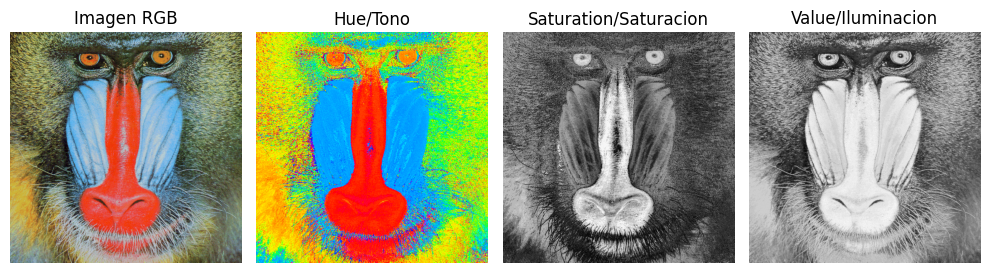

In [19]:
url = "https://github.com/androbaza/standard-test-images/raw/refs/heads/main/mandril_color.tif"
urllib.request.urlretrieve(url, "mandril_color.tif")

# Cargamos una imagen a Color
imagenRGB = util.img_as_float64(io.imread("mandril_color.tif"))

imageHSV = color.rgb2hsv(imagenRGB)

# Todos los canales van de 0 a 1

# Canal 0 = Hue
imagenHue = imageHSV[:,:,0]

# Canal 1 = Saturation
imagenSat = imageHSV[:,:,1]

# Canal 2 = Value
imagenVal = imageHSV[:,:,2]

fig, axes = plt.subplots(1, 4, figsize=(10, 10))
ax = axes.ravel()

ax[0].imshow(imagenRGB, clim=(0,1))
ax[0].set_title(f"Imagen RGB")
ax[0].axis("off")

ax[1].imshow(imagenHue, cmap='hsv', clim=(0,1))
ax[1].set_title(f"Hue/Tono")
ax[1].axis("off")

ax[2].imshow(imagenSat, cmap='gray', clim=(0,1))
ax[2].set_title(f"Saturation/Saturacion")
ax[2].axis("off")


ax[3].imshow(imagenVal, cmap='gray', clim=(0,1))
ax[3].set_title(f"Value/Iluminacion")
ax[3].axis("off")



plt.tight_layout()
plt.show()

## ***Ejercicio***: Realce de Saturacion
Dada una imagen y una constante c, aumentar su saturacion convirtiendola en HSV, multiplicar cada pixel en el plano de la saturacion por c y reconvertirla a RGB. Ver que cuando c > 1, esto aumenta la intensidad aparente y con c < 1 la reduce.

*RECORDAR QUE AL RECONVERTIR, LOS VALORES DEBEN SER VALIDOS.*

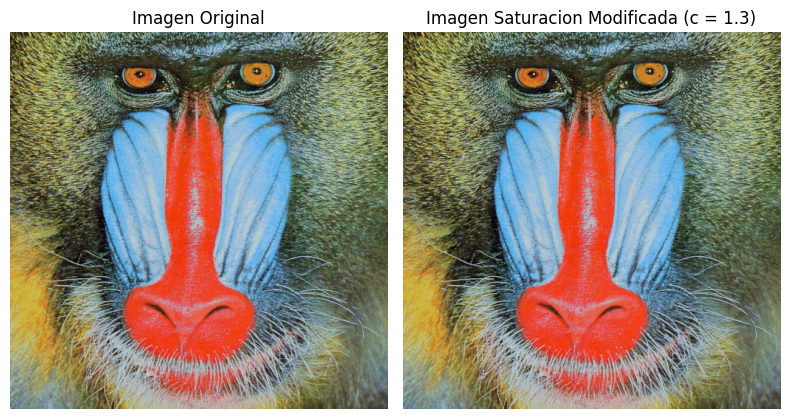

In [20]:
def modificarSat(imagen, c):
  imagenHSV = color.rgb2hsv(imagen)

  #COMPLETAR
  return color.hsv2rgb(imagenHSV)

CONS = 1.3

imagenRGB = util.img_as_float64(io.imread("mandril_color.tif"))
imagenRealce = modificarSat(imagenRGB, CONS)

fig, axes = plt.subplots(1, 2, figsize=(8, 8))
ax = axes.ravel()

ax[0].imshow(imagenRGB, clim=(0,1))
ax[0].set_title(f"Imagen Original")
ax[0].axis("off")

ax[1].imshow(imagenRealce, clim=(0,1))
ax[1].set_title(f"Imagen Saturacion Modificada (c = {CONS})")
ax[1].axis("off")

plt.tight_layout()
plt.show()

## ***Ejercicio***: Alteracion de Hue (cambio de tono)

Dada una imagen y una constante c, cambiar el tono de la imagen convirtiendola en HSV, Sumar cada pixel en el plano de Hue por c y reconvertirla a RGB. Ver el efecto en los colores cuando c es muy chico yque sucede cuando c es muy grande.

**Ayuda**: *Recordar que el tono representa un angulo en la **rueda de color**, donde 0 = 0 y 1 = 2π. Si al sumar una constante el valor es mayor a 1, el angulo deberia **dar la vuelta** como las manijas de un reloj. Lo mismo si c es negativo.*

Por ejemplo, si c fuera 0.5, es decir sumar el angulo π, la transformacion tendria la forma:

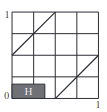

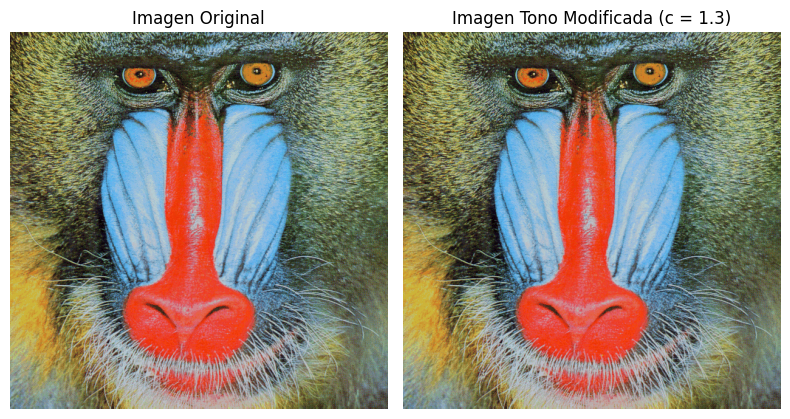

In [21]:
def cambioDeTono(imagen, c):
  imagenHSV = color.rgb2hsv(imagen)
  tono = imagenHSV[:,:,0]
  tono_en_radianes = tono * 2 * np.pi # Lo pasamos a radianes

  #COMPLETAR

  return color.hsv2rgb(imagenHSV)
CONS = 1.3

imagenRGB = util.img_as_float64(io.imread("mandril_color.tif"))
imagenRealce = cambioDeTono(imagenRGB, CONS)

fig, axes = plt.subplots(1, 2, figsize=(8, 8))
ax = axes.ravel()

ax[0].imshow(imagenRGB, clim=(0,1))
ax[0].set_title(f"Imagen Original")
ax[0].axis("off")

ax[1].imshow(imagenRealce, clim=(0,1))
ax[1].set_title(f"Imagen Tono Modificada (c = {CONS})")
ax[1].axis("off")

plt.tight_layout()
plt.show()

## ***Ejercicio***: Ecualizacion De Iluminacion
Dada una imagen, realizar una ecualizacion del histograma sobre su calan de Value/Iluminacion y luego reconvertirla a RGB. Compararlo con aplicar ecualizacion sobre los tres canales.

Utilizar la funcion `exposure.equalize_hist(img)`




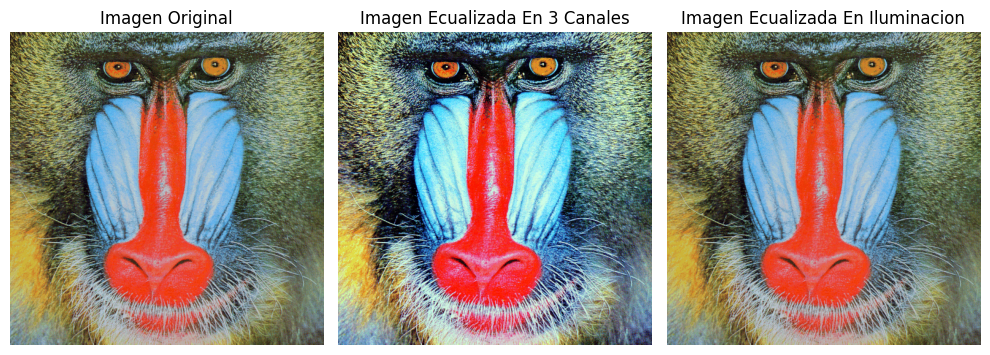

In [22]:
from skimage import exposure

def ecualizacion3Canales(imagen):
  imgR = exposure.equalize_hist(imagen[:,:,0])
  imgG = exposure.equalize_hist(imagen[:,:,1])
  imgB = exposure.equalize_hist(imagen[:,:,2])

  imgEcualizada = imagen.copy()

  imgEcualizada[:,:,0] = imgR
  imgEcualizada[:,:,1] = imgG
  imgEcualizada[:,:,2] = imgB

  return imgEcualizada

def ecualizacionDeVal(imagen):
  imagenHSV = color.rgb2hsv(imagen)
  #COMPLETAR
  return color.hsv2rgb(imagenHSV)

imagenRGB = util.img_as_float64(io.imread("mandril_color.tif"))
imagenEcualizada3C = ecualizacion3Canales(imagenRGB)
imagenEcualizadaIlum = ecualizacionDeVal(imagenRGB)

fig, axes = plt.subplots(1, 3, figsize=(10, 10))
ax = axes.ravel()

ax[0].imshow(imagenRGB, clim=(0,1))
ax[0].set_title(f"Imagen Original")
ax[0].axis("off")

ax[1].imshow(imagenEcualizada3C, clim=(0,1))
ax[1].set_title(f"Imagen Ecualizada En 3 Canales")
ax[1].axis("off")

ax[2].imshow(imagenEcualizadaIlum, clim=(0,1))
ax[2].set_title(f"Imagen Ecualizada En Iluminacion")
ax[2].axis("off")

plt.tight_layout()
plt.show()

## **Colores Falsos**
No existe ninguna restriccion sobre que los canales R,G,B de una imagen solo puedan contener los valores de la intensidad del espectro electromagnetico visible, en realidad podemos codificar cualquier tipo de señal en los colores de una imagen para ayudar a visualizar informacion. Por ejemplo, podriamos visualizar longitudes de onda invisibles capturadas por telescopios espaciales (rayos X, ultravioleta, radio), como en las famosas imagenes del Hubble o el James Webb, donde cada canal RGB corresponde a un filtro distinto y no a "color real".



![](https://media.springernature.com/lw703/springer-static/image/art%3A10.1038%2Fnature.2015.17345/MediaObjects/41586_2015_Article_BFnature201517345_Figa_HTML.jpg)

## ***Ejercicio***: Colorear imagenes satelitales
Dada algunas de las bandas del espectro electromagnetico, mas derivadas de ellas, disponibles para una imagen satelital de Brazil, crear una imagen donde se vea claramente las zonas de vegetacion, desarrollo urbano y agua.

Imagen de Referencia:


![](https://github.com/StrawEater/PracticasPDI3erBimestre/blob/main/Laboratorios/Labo_03_color/Screenshot%202026-08-31%20042233.png?raw=true)

Descargamos las bandas

In [23]:
import rasterio
import requests
import numpy as np
import matplotlib.patches as mpatches
from io import BytesIO

BASE_URL = "https://raw.githubusercontent.com/StrawEater/PracticasPDI3erBimestre/main/Laboratorios/Labo_03_color/"

def leer_banda_url(nombre_archivo):
    r = requests.get(BASE_URL + nombre_archivo)
    r.raise_for_status()
    with rasterio.open(BytesIO(r.content)) as src:
        return src.read(1)

archivos = {
    "B01": "manaus_brasil_B01.tif",
    "B02": "manaus_brasil_B02.tif",
    "B03": "manaus_brasil_B03.tif",
    "B04": "manaus_brasil_B04.tif",
    "B07": "manaus_brasil_B07.tif",
    "B08": "manaus_brasil_B08.tif",
    "B09": "manaus_brasil_B09.tif",
    "B11": "manaus_brasil_B11.tif",
    "B12": "manaus_brasil_B12.tif",
}

descripciones = {
    "B01": "443 nm. Banda de aerosoles costeros.",
    "B02": "490 nm. Banda azul del espectro visible.",
    "B03": "560 nm. Banda verde del espectro visible.",
    "B04": "665 nm. Banda roja del espectro visible.",
    "B07": "783 nm. Banda de borde rojo (red edge).",
    "B08": "842 nm. Banda del infrarrojo cercano (NIR).",
    "B09": "945 nm. Banda de vapor de agua.",
    "B11": "1610 nm. Banda del infrarrojo de onda corta (SWIR 1).",
    "B12": "2190 nm. Banda del infrarrojo de onda corta (SWIR 2).",
}

bandas = {
    nombre: {"data": leer_banda_url(archivo), "nombre": nombre, "descripcion": descripciones[nombre]}
    for nombre, archivo in archivos.items()
}

ndvi = (bandas["B08"]["data"].astype(float) - bandas["B04"]["data"].astype(float)) / (bandas["B08"]["data"] + bandas["B04"]["data"] + 1e-6)
ndwi = (bandas["B03"]["data"].astype(float) - bandas["B08"]["data"].astype(float)) / (bandas["B03"]["data"] + bandas["B08"]["data"] + 1e-6)
ndbi = (bandas["B11"]["data"].astype(float) - bandas["B08"]["data"].astype(float)) / (bandas["B11"]["data"] + bandas["B08"]["data"] + 1e-6)

bandas["ndvi"] = {"data": ndvi, "nombre": "NDVI", "descripcion": "Combina una banda del infrarrojo cercano con una banda del visible rojo, porque ambas responden de forma opuesta según la actividad interna del material."}
bandas["ndwi"] = {"data": ndwi, "nombre": "NDWI", "descripcion": "Combina una banda del visible verde con una banda del infrarrojo cercano, porque ambas responden de forma opuesta según el contenido interno de la superficie."}
bandas["ndbi"] = {"data": ndbi, "nombre": "NDBI", "descripcion": "Combina una banda del infrarrojo de onda corta con una banda del infrarrojo cercano, porque ambas responden de forma opuesta según la densidad del material."}

Conseguimos la imagen original

In [24]:
#Color natural
def stretch_rgb(r, g, b, p_bajo=2, p_alto=98):
    def norm(banda):
        lo, hi = np.percentile(banda, (p_bajo, p_alto))
        return np.clip((banda.astype(float) - lo) / (hi - lo + 1e-6), 0, 1)
    return np.dstack([norm(r), norm(g), norm(b)])

color_natural = stretch_rgb(bandas["B04"]["data"], bandas["B03"]["data"], bandas["B02"]["data"])

Funciones auxiliares

In [25]:
def normalizar_indice(indice, p_bajo=2, p_alto=98):
    lo, hi = np.percentile(indice, (p_bajo, p_alto))
    return np.clip((indice - lo) / (hi - lo + 1e-6), 0, 1)


def plot_indices(color_natural, bandas_a_graficar):
    """
    Grafica color natural + N bandas/índices (normalizados a 0-1) en una fila.

    bandas_a_graficar: lista de dicts tipo bandas["B02"], es decir:
        - "data": array 2D
        - "nombre": usado como título
        - "cmap" (opcional): colormap, default "viridis"
    """
    n = len(bandas_a_graficar) + 1
    fig, ax = plt.subplots(1, n, figsize=(6 * n, 6))

    ax[0].imshow(color_natural)
    ax[0].set_title("Color natural (referencia)")
    ax[0].axis("off")

    for i, banda in enumerate(bandas_a_graficar, start=1):
        data_norm = normalizar_indice(banda["data"])
        cmap = banda.get("cmap", "viridis")
        im = ax[i].imshow(data_norm, cmap=cmap, vmin=0, vmax=1)
        ax[i].set_title(banda["nombre"])
        ax[i].axis("off")
        plt.colorbar(im, ax=ax[i], fraction=0.046)

    plt.tight_layout()
    plt.show()


def plot_composite(color_natural, r_banda, g_banda, b_banda,
                    r_color="red", g_color="green", b_color="blue",
                    titulo_composite="Composite de bandas"):
    """
    Grafica color natural vs un composite RGB (normalizado a 0-1).

    r_banda, g_banda, b_banda: dicts tipo bandas["B02"] (usa "data" y "nombre")
    """
    composite = np.dstack([
        normalizar_indice(r_banda["data"]),
        normalizar_indice(g_banda["data"]),
        normalizar_indice(b_banda["data"]),
    ])

    fig, ax = plt.subplots(1, 2, figsize=(18, 9))

    ax[0].imshow(color_natural)
    ax[0].set_title("Color natural (imagen original)")
    ax[0].axis("off")

    ax[1].imshow(composite)
    ax[1].set_title(f"{titulo_composite}\nR = {r_banda['nombre']} · G = {g_banda['nombre']} · B = {b_banda['nombre']}")
    ax[1].axis("off")

    leyenda = [
        mpatches.Patch(color=r_color, label=r_banda["nombre"]),
        mpatches.Patch(color=g_color, label=g_banda["nombre"]),
        mpatches.Patch(color=b_color, label=b_banda["nombre"]),
    ]
    ax[1].legend(handles=leyenda, loc="upper right", framealpha=0.9)

    plt.tight_layout()
    plt.show()

**Consigna**: prueben con diferentes bandas para conseguir una imagen coloreada que muestre claramente vegetacion, desarrollo urbano y agua.

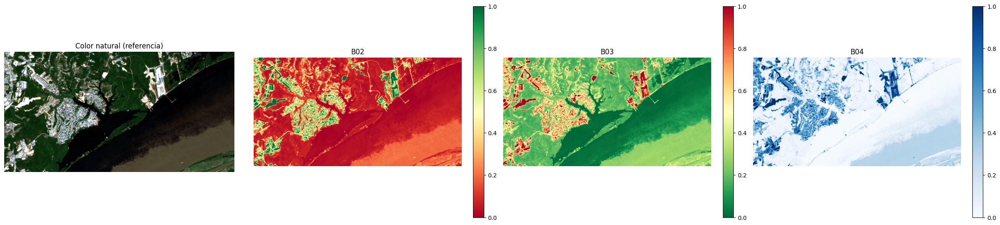

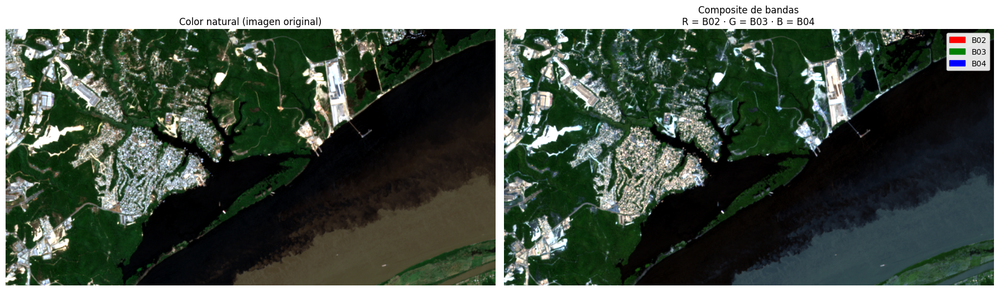

In [29]:
# Cuidado, usen ** para que funciona, crea una copia del diccionario
# RdYlGn color map divergente, los colores negativos van a rojo, los positivos a verde
# Blues color map lineal, cuanto mas azul, mayor es el numero.
# RdYlGn_r color map inverso de RdYlGn
# Pueden modificarlos para que les ayude a visualizar que representa cada banda
# Lista completa de color maps: https://matplotlib.org/stable/users/explain/colors/colormaps.html

# TODAS LAS BANDAS SE NORMALIZAN A [0, 1] DE FORMA AUTOMATICA EN LA FUNCION
plot_indices(color_natural, [
    {**bandas["B02"], "cmap": "RdYlGn"},
    {**bandas["B03"], "cmap": "RdYlGn_r"},
    {**bandas["B04"], "cmap": "Blues"},
])

plot_composite(color_natural, bandas["B02"], bandas["B03"], bandas["B04"])